<a href="https://colab.research.google.com/github/raychayut17/deep-learning/blob/master/ShitPostNeuralNetwork.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Shitpost Neural Network


## Installing and Importing modules

In [1]:
!pip install -q tf-nightly

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
% tensorflow_version 2.x
import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import PIL.Image

In [4]:
print(tf.__version__)

2.4.0-dev20200730


# Data Preprocessing

## Specifying the data's path

In [5]:
import pathlib
data_dir = pathlib.Path("/content/drive/My Drive/mnSet")

This snippet counts all the images in the folder:

In [6]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

64


Displaying an image:

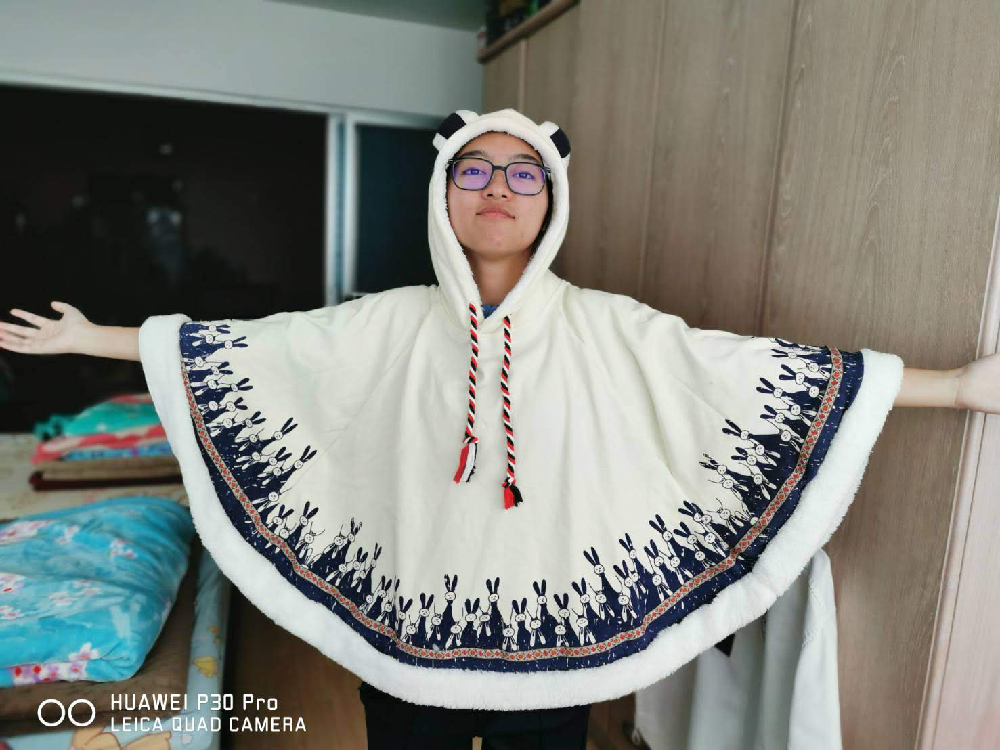

In [7]:
mn = list(data_dir.glob('mn/*'))
PIL.Image.open(str(mn[0]))

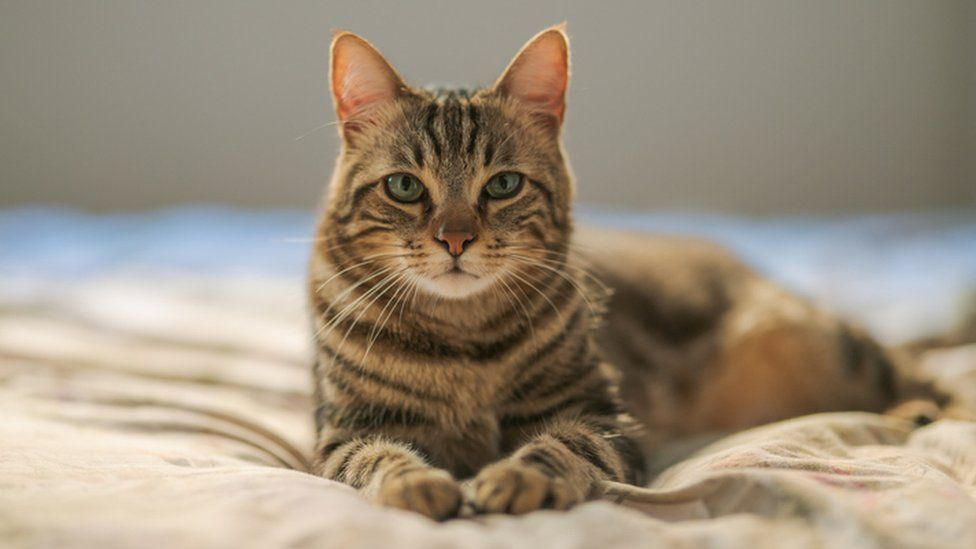

In [8]:
cats = list(data_dir.glob('cats/*'))
PIL.Image.open(str(cats[0]))

## Loading the dataset with keras.preprocessing

In [9]:
BATCH_SIZE = 16
IMG_WIDTH = 160

In [10]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.25,
  subset="training",
  seed=123,
  image_size=(IMG_WIDTH, IMG_WIDTH),
  batch_size=BATCH_SIZE,
  label_mode='categorical')

Found 64 files belonging to 2 classes.
Using 48 files for training.


In [11]:
validation_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.25,
  subset="validation",
  seed=123,
  image_size=(IMG_WIDTH, IMG_WIDTH),
  batch_size=BATCH_SIZE,
  label_mode='categorical')

Found 64 files belonging to 2 classes.
Using 16 files for validation.


In [12]:
for image, a in validation_ds.take(1):
  print(image.shape)

(16, 160, 160, 3)


In [13]:
class_names = train_ds.class_names
print(class_names)

['cats', 'mn']


In [14]:
def format_example(image, label):
    image = (image/127.5)-1
    return image, label

In [15]:
# train_batches = train_ds.shuffle(64).batch(16)
# validation_batches = validation_ds.batch(16)
train_batches = train_ds.map(format_example).shuffle(48)
validation_batches = validation_ds.map(format_example).shuffle(16)

# Creating the Neural Network

## Importing MobileNetV2 as the Convolutional Base
Why? Because I'm lazy!

In [16]:
IMG_SHAPE = (IMG_WIDTH, IMG_WIDTH, 3)
conv_base = tf.keras.applications.MobileNetV2(input_shape = IMG_SHAPE,
                                              include_top = False,
                                              weights='imagenet')
conv_base.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 161, 161, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
_______________________________________________________________________________

In [17]:
for image, _ in train_batches.take(1):
  pass
feature_batch = conv_base(image)
print(feature_batch.shape)

(16, 5, 5, 1280)


Freezing the base:

In [18]:
conv_base.trainable = False
conv_base.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 161, 161, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 80, 80, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 80, 80, 32)   128         Conv1[0][0]                      
_______________________________________________________________________________

## Creating additional layers

In [19]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
prediction_layer = tf.keras.layers.Dense(2, activation='sigmoid')

## Creating and Training the model

In [20]:
model = tf.keras.Sequential([
                             conv_base,
                             global_average_layer,
                             prediction_layer
])

In [21]:
base_learning_rate = 0.001
model.compile(optimizer="adam",# tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])
initial_epochs=2
validation_steps=4

In [22]:
history=model.fit(train_batches,
                  epochs=initial_epochs,
                  validation_data=validation_batches)

Epoch 1/2
3/3 [==============================] - 6s 2s/step - loss: 0.7609 - accuracy: 0.5365 - val_loss: 0.2963 - val_accuracy: 1.0000
Epoch 2/2
3/3 [==============================] - 3s 1s/step - loss: 0.4551 - accuracy: 0.8099 - val_loss: 0.1693 - val_accuracy: 1.0000


In [23]:
acc = history.history['accuracy']
print(acc)

[0.6041666865348816, 0.8541666865348816]


## Saving the model

In [24]:
model.save("shitpost.h5")

# Testing the model by loading in an image

In [27]:
datSet = "mn" # Please choose from "mn" and "cats"
i = 5 # int; 0-31

image = tf.keras.preprocessing.image.load_img(f"/content/drive/My Drive/mnSet/{datSet}/{i+1}.jpg",
                                              target_size=(IMG_WIDTH, IMG_WIDTH))
input_arr = tf.keras.preprocessing.image.img_to_array(image)
input_arr = (input_arr/127.5)-1
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = model.predict(input_arr)
print(predictions)
label = ['Cat', 'Moonny']
print("Predicted Label: {}".format(label[np.argmax(predictions)]))

[[0.08315793 0.4838064 ]]
Predicted Label: Moonny


For displaying the image. Please choose the cell correctly:

For mn dataset:

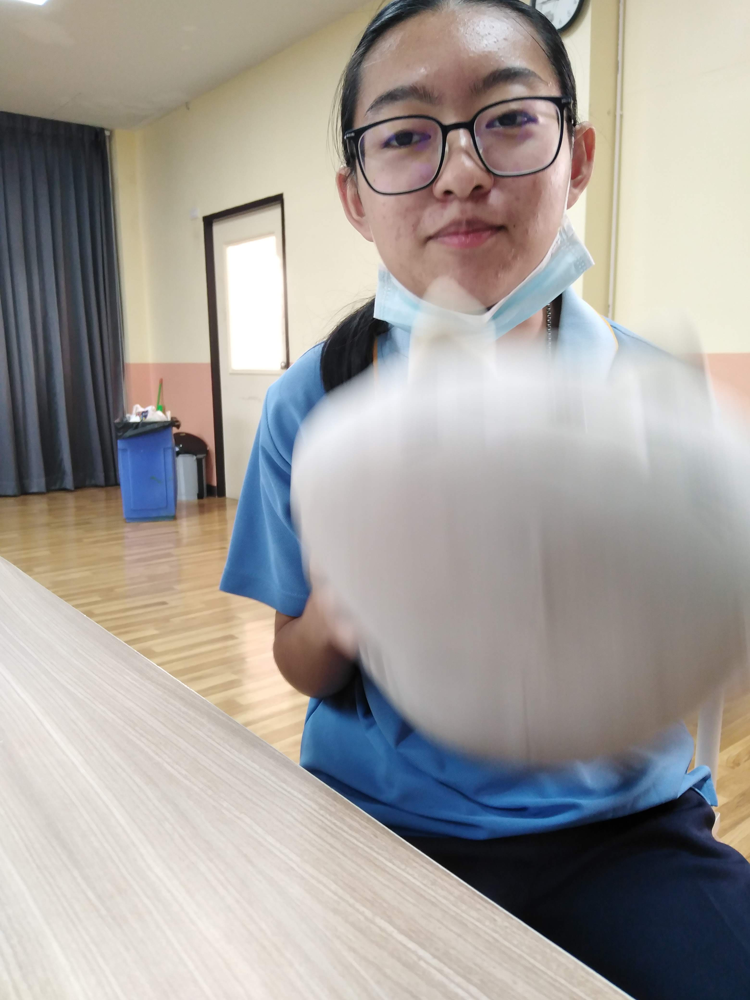

In [28]:
mn = list(data_dir.glob('mn/*'))
PIL.Image.open(str(mn[i]))

For cat dataset:

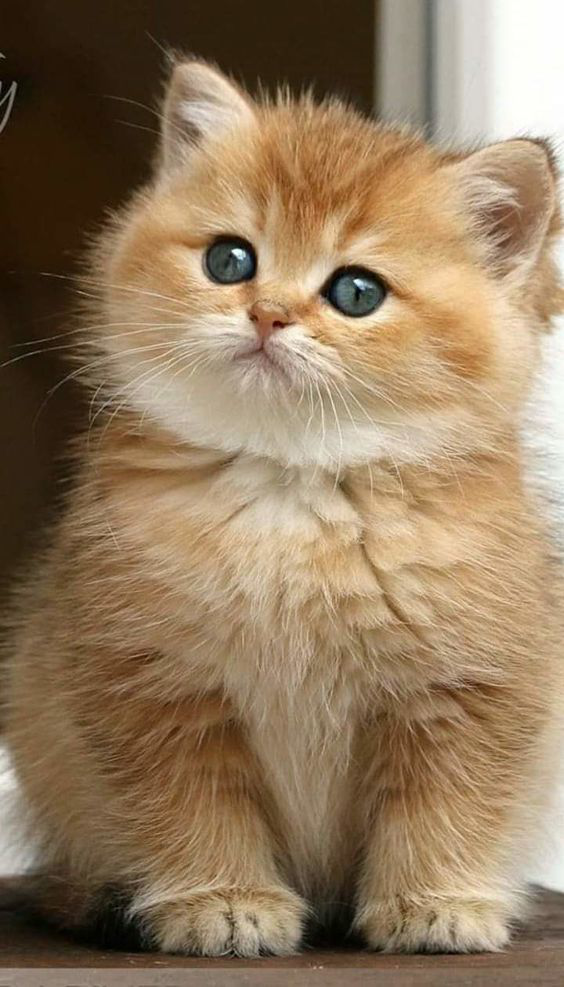

In [26]:
cat = list(data_dir.glob('cats/*'))
PIL.Image.open(str(cat[i]))